In [1]:
import polars as pl

In [2]:
data = pl.read_csv('processed_data.csv')
data

review,review_translate,rating,entity_name,dataset_name,title_translate,translated,review_translate_sentences,review_translate_sentences_tokens,review_translate_sentences_pos,review_translate_sentences_lemma,is_question
str,str,f64,str,str,str,bool,str,str,str,str,str
"""Якісна пластмаса, переворот 36…","""Якісна пластмаса , переворот 3…",5.0,"""screechers_wild_eu684204""","""rozetka""",null,false,"""['Якісна пластмаса , переворот…","""[['Якісна', 'пластмаса', ',', …","""[['ADJF', 'NOUN', 'PNCT', 'NOU…","""[['якісний', 'пластмаса', ',',…","""[False]"""
"""За такі гроші це самий топ ""","""За такі гроші це самий топ""",5.0,"""xiaomi_hsej03jy_black""","""rozetka""",null,false,"""['За такі гроші це самий топ']""","""[['За', 'такі', 'гроші', 'це',…","""[['ADVB', 'NPRO', 'NOUN', 'PRC…","""[['за', 'такий', 'гріш', 'це',…","""[False]"""
"""За такі гроші - просто супер! …","""За такі гроші - просто супер !…",5.0,"""esperanza_eza108""","""rozetka""",null,false,"""['За такі гроші - просто супер…","""[['За', 'такі', 'гроші', '-', …","""[['ADVB', 'NPRO', 'NOUN', 'PNC…","""[['за', 'такий', 'гріш', '-', …","""[False, False]"""
"""Виконує свою роботу не погано.…","""Виконує свою роботу не погано …",4.0,"""voin_v_80""","""rozetka""",null,false,"""['Виконує свою роботу не поган…","""[['Виконує', 'свою', 'роботу',…","""[['VERB', 'NPRO', 'NOUN', 'PRC…","""[['виконувати', 'свій', 'робот…","""[False, True, True, False, Fal…"
"""Купляв на стару сістему як осн…","""Купляв на стару сістему як осн…",4.0,"""kingston_sa400s37_240g""","""rozetka""",null,false,"""['Купляв на стару сістему як о…","""[['Купляв', 'на', 'стару', 'сі…","""[['VERB', 'INTJ', 'ADJF', 'NOU…","""[['купляти', 'на', 'старий', '…","""[False, False]"""
…,…,…,…,…,…,…,…,…,…,…,…
"""Очень приятная атмосфера. Хоро…","""Дуже приємна атмосфера . Гарне…",5.0,"""Restaurant_Review-g4758410-d86…","""tripadvisor_restaurants_ukrain…","""Шикарне місце""",true,"""['Дуже приємна атмосфера .', '…","""[['Дуже', 'приємна', 'атмосфер…","""[['ADVB', 'ADJF', 'NOUN', 'PNC…","""[['дуже', 'приємний', 'атмосфе…","""[False, False, False, False]"""
"""Понравилось диетическое питани…","""Сподобалося дієтичне харчуванн…",5.0,"""Restaurant_Review-g4758410-d86…","""tripadvisor_restaurants_ukrain…","""Дієтичні""",true,"""['Сподобалося дієтичне харчува…","""[['Сподобалося', 'дієтичне', '…","""[['VERB', 'ADJF', 'NOUN', 'PNC…","""[['сподобатися', 'дієтичний', …","""[False, False, False]"""
"""Заказали разные блюда, все был…","""Ми замовляли різні страви , вс…",5.0,"""Restaurant_Review-g4758410-d86…","""tripadvisor_restaurants_ukrain…","""Смачна їжа за доступними цінам…",true,"""['Ми замовляли різні страви , …","""[['Ми', 'замовляли', 'різні', …","""[['NPRO', 'VERB', 'ADJF', 'NOU…","""[['ми', 'замовляти', 'різний',…","""[False, False]"""


In [3]:
data[3,'review']

'Виконує свою роботу не погано.але що ви хотіли?коли він працює від прикурювача,щоб він тягнув як домашній від 220В?за таку ціну я думаю кращого немає!!! '

In [4]:
data.columns

['review',
 'review_translate',
 'rating',
 'entity_name',
 'dataset_name',
 'title_translate',
 'translated',
 'review_translate_sentences',
 'review_translate_sentences_tokens',
 'review_translate_sentences_pos',
 'review_translate_sentences_lemma',
 'is_question']

In [5]:
data[3, 'review_translate_sentences_lemma']

"[['виконувати', 'свій', 'робот', 'не', 'погана', '.'], ['але', 'що', 'ви', 'хотіти', '?'], ['коли', 'він', 'працювати', 'від', 'прикурювач', ',', 'щоб', 'він', 'тягнути', 'як', 'домашній', 'від', '220ти', '?'], ['за', 'такий', 'ціна', 'я', 'думати', 'кращий', 'немає', '!', '!'], ['!']]"

In [6]:
with open("ua-stopwords.txt", "r", encoding="utf-8") as file:
    # Split the file content into a list of lines (reviews).
    stop_words = file.read().splitlines()

In [7]:
import polars as pl
import spacy_udpipe
import string

class UkrainianReviewPreprocessor:
    def __init__(self, model_lang: str = 'uk', stopwords: set = None):
        """
        Initialize the preprocessor.
        
        :param model_lang: Language code for the UDPipe model. Default 'uk' for Ukrainian.
        :param stopwords: Optional set of stopwords to filter out.
        """
        # Load the Ukrainian UDPipe model using spaCy‑UDPipe
        self.nlp = spacy_udpipe.load(model_lang)
        # Use provided stopwords or a minimal default list (expand this list as needed)
        if stopwords is not None:
            self.stopwords = set(stopwords)
        else:
            self.stopwords = {
                "і", "та", "але", "що", "це", "від", "з", "на", "до", "як", "такий", "чи"
            }

    def preprocess_text(self, text: str) -> list:
        """
        Process a single review text: tokenization, lemmatization, lowercasing,
        and filtering of punctuation, stopwords, and numeric tokens.
        
        :param text: The review text.
        :return: A list of processed tokens.
        """
        # Basic cleanup: strip extra whitespace
        text = text.strip()
        # Process text with spaCy‑UDPipe
        doc = self.nlp(text)
        tokens = []
        for token in doc:
            # Skip tokens that are pure punctuation
            if token.text in string.punctuation:
                continue
            # Get the lemma, lowercase it, and strip extra spaces
            token_text = token.lemma_.lower().strip()
            # Skip if the token is empty, a stopword, or purely numeric
            if not token_text or token_text in self.stopwords or token_text.isdigit():
                continue
            tokens.append(token_text)
        return tokens

    def preprocess_dataframe(self, 
                             df: pl.DataFrame, 
                             review_column: str = "відгук", 
                             tokens_column: str = "токени", 
                             joined_column: str = "токенізований_рядок") -> pl.DataFrame:
        """
        Preprocess reviews in a Polars DataFrame.
        
        :param df: Polars DataFrame containing reviews.
        :param review_column: Column name containing review text.
        :param tokens_column: Column name to store the list of tokens.
        :param joined_column: Column name to store the joined tokens string.
        :return: A Polars DataFrame with new columns for tokens and joined tokens.
        """
        # Apply preprocessing on the review_column
        df = df.with_columns(
            pl.col(review_column).map_elements(lambda x: self.preprocess_text(x),return_dtype=pl.List(pl.String)).alias(tokens_column)
        )
        # Join tokens into a single string for TF‑IDF vectorization
        df = df.with_columns(
            pl.col(tokens_column).map_elements(lambda tokens: " ".join(tokens), return_dtype=pl.String).alias(joined_column)
        )
        return df

    def get_tfidf_input(self, df: pl.DataFrame, joined_column: str = "токенізований_рядок") -> list:
        """
        Get a list of joined token strings from the DataFrame for TF‑IDF vectorization.
        
        :param df: Polars DataFrame with a column of joined token strings.
        :param joined_column: Column name containing joined tokens.
        :return: List of strings.
        """
        return df[joined_column].to_list()


# Example usage:
# if __name__ == "__main__":
#     # Example DataFrame with Ukrainian reviews
#     data = {
#         "відгук": [
#             "Цей продукт чудовий! Я задоволений покупкою.",
#             "Ніколи більше не купуватиму. Жахливе обслуговування та неякісний товар.",
#             "Продукт відповідає опису, все добре.",
#             "Супер якість, рекомендую всім!"
#         ]
#     }
#     df = pl.DataFrame(data)
    
#     # Initialize the preprocessor
#     preprocessor = UkrainianReviewPreprocessor()
    
#     # Preprocess the DataFrame (adding 'токени' and 'токенізований_рядок' columns)
#     df_processed = preprocessor.preprocess_dataframe(df)
    
#     print("Processed DataFrame:")
#     print(df_processed)
    
#     # Get a list of strings ready for TF-IDF vectorization
#     tfidf_input = preprocessor.get_tfidf_input(df_processed)
#     print("\nTF-IDF Input:")
#     print(tfidf_input)


In [91]:
data[:5]

review,review_translate,rating,entity_name,dataset_name,title_translate,translated,review_translate_sentences,review_translate_sentences_tokens,review_translate_sentences_pos,review_translate_sentences_lemma,is_question
str,str,f64,str,str,str,bool,str,str,str,str,str
"""Якісна пластмаса, переворот 36…","""Якісна пластмаса , переворот 3…",5.0,"""screechers_wild_eu684204""","""rozetka""",null,false,"""['Якісна пластмаса , переворот…","""[['Якісна', 'пластмаса', ',', …","""[['ADJF', 'NOUN', 'PNCT', 'NOU…","""[['якісний', 'пластмаса', ',',…","""[False]"""
"""За такі гроші це самий топ ""","""За такі гроші це самий топ""",5.0,"""xiaomi_hsej03jy_black""","""rozetka""",null,false,"""['За такі гроші це самий топ']""","""[['За', 'такі', 'гроші', 'це',…","""[['ADVB', 'NPRO', 'NOUN', 'PRC…","""[['за', 'такий', 'гріш', 'це',…","""[False]"""
"""За такі гроші - просто супер! …","""За такі гроші - просто супер !…",5.0,"""esperanza_eza108""","""rozetka""",null,false,"""['За такі гроші - просто супер…","""[['За', 'такі', 'гроші', '-', …","""[['ADVB', 'NPRO', 'NOUN', 'PNC…","""[['за', 'такий', 'гріш', '-', …","""[False, False]"""
"""Виконує свою роботу не погано.…","""Виконує свою роботу не погано …",4.0,"""voin_v_80""","""rozetka""",null,false,"""['Виконує свою роботу не поган…","""[['Виконує', 'свою', 'роботу',…","""[['VERB', 'NPRO', 'NOUN', 'PRC…","""[['виконувати', 'свій', 'робот…","""[False, True, True, False, Fal…"
"""Купляв на стару сістему як осн…","""Купляв на стару сістему як осн…",4.0,"""kingston_sa400s37_240g""","""rozetka""",null,false,"""['Купляв на стару сістему як о…","""[['Купляв', 'на', 'стару', 'сі…","""[['VERB', 'INTJ', 'ADJF', 'NOU…","""[['купляти', 'на', 'старий', '…","""[False, False]"""


In [8]:
preprocessor = UkrainianReviewPreprocessor(model_lang='uk',
                                           stopwords=set(stop_words))

In [9]:
preprocessor.preprocess_dataframe(pl.from_dataframe(data[:5]), review_column='review',tokens_column='tokens', joined_column='tokenized_review')

review,review_translate,rating,entity_name,dataset_name,title_translate,translated,review_translate_sentences,review_translate_sentences_tokens,review_translate_sentences_pos,review_translate_sentences_lemma,is_question,tokens,tokenized_review
str,str,f64,str,str,str,bool,str,str,str,str,str,list[str],str
"""Якісна пластмаса, переворот 36…","""Якісна пластмаса , переворот 3…",5.0,"""screechers_wild_eu684204""","""rozetka""",null,false,"""['Якісна пластмаса , переворот…","""[['Якісна', 'пластмаса', ',', …","""[['ADJF', 'NOUN', 'PNCT', 'NOU…","""[['якісний', 'пластмаса', ',',…","""[False]""","[""якісний"", ""пластмаса"", … ""градусвти""]","""якісний пластмаса переворот гр…"
"""За такі гроші це самий топ ""","""За такі гроші це самий топ""",5.0,"""xiaomi_hsej03jy_black""","""rozetka""",null,false,"""['За такі гроші це самий топ']""","""[['За', 'такі', 'гроші', 'це',…","""[['ADVB', 'NPRO', 'NOUN', 'PRC…","""[['за', 'такий', 'гріш', 'це',…","""[False]""","[""гроші"", ""топ""]","""гроші топ"""
"""За такі гроші - просто супер! …","""За такі гроші - просто супер !…",5.0,"""esperanza_eza108""","""rozetka""",null,false,"""['За такі гроші - просто супер…","""[['За', 'такі', 'гроші', '-', …","""[['ADVB', 'NPRO', 'NOUN', 'PNC…","""[['за', 'такий', 'гріш', '-', …","""[False, False]""","[""гроші"", ""суперти"", ""рекомендувати""]","""гроші суперти рекомендувати"""
"""Виконує свою роботу не погано.…","""Виконує свою роботу не погано …",4.0,"""voin_v_80""","""rozetka""",null,false,"""['Виконує свою роботу не поган…","""[['Виконує', 'свою', 'роботу',…","""[['VERB', 'NPRO', 'NOUN', 'PRC…","""[['виконувати', 'свій', 'робот…","""[False, True, True, False, Fal…","[""виконувати"", ""робота"", … ""!!!""]","""виконувати робота погано працю…"
"""Купляв на стару сістему як осн…","""Купляв на стару сістему як осн…",4.0,"""kingston_sa400s37_240g""","""rozetka""",null,false,"""['Купляв на стару сістему як о…","""[['Купляв', 'на', 'стару', 'сі…","""[['VERB', 'INTJ', 'ADJF', 'NOU…","""[['купляти', 'на', 'старий', '…","""[False, False]""","[""купляти"", ""старий"", … ""ssd""]","""купляти старий сістема основни…"


In [40]:
type(pl.from_dataframe(data[:5]))

polars.dataframe.frame.DataFrame

In [10]:
data = data.filter(pl.col('dataset_name') == 'rozetka')
data

review,review_translate,rating,entity_name,dataset_name,title_translate,translated,review_translate_sentences,review_translate_sentences_tokens,review_translate_sentences_pos,review_translate_sentences_lemma,is_question
str,str,f64,str,str,str,bool,str,str,str,str,str
"""Якісна пластмаса, переворот 36…","""Якісна пластмаса , переворот 3…",5.0,"""screechers_wild_eu684204""","""rozetka""",null,false,"""['Якісна пластмаса , переворот…","""[['Якісна', 'пластмаса', ',', …","""[['ADJF', 'NOUN', 'PNCT', 'NOU…","""[['якісний', 'пластмаса', ',',…","""[False]"""
"""За такі гроші це самий топ ""","""За такі гроші це самий топ""",5.0,"""xiaomi_hsej03jy_black""","""rozetka""",null,false,"""['За такі гроші це самий топ']""","""[['За', 'такі', 'гроші', 'це',…","""[['ADVB', 'NPRO', 'NOUN', 'PRC…","""[['за', 'такий', 'гріш', 'це',…","""[False]"""
"""За такі гроші - просто супер! …","""За такі гроші - просто супер !…",5.0,"""esperanza_eza108""","""rozetka""",null,false,"""['За такі гроші - просто супер…","""[['За', 'такі', 'гроші', '-', …","""[['ADVB', 'NPRO', 'NOUN', 'PNC…","""[['за', 'такий', 'гріш', '-', …","""[False, False]"""
"""Виконує свою роботу не погано.…","""Виконує свою роботу не погано …",4.0,"""voin_v_80""","""rozetka""",null,false,"""['Виконує свою роботу не поган…","""[['Виконує', 'свою', 'роботу',…","""[['VERB', 'NPRO', 'NOUN', 'PRC…","""[['виконувати', 'свій', 'робот…","""[False, True, True, False, Fal…"
"""Купляв на стару сістему як осн…","""Купляв на стару сістему як осн…",4.0,"""kingston_sa400s37_240g""","""rozetka""",null,false,"""['Купляв на стару сістему як о…","""[['Купляв', 'на', 'стару', 'сі…","""[['VERB', 'INTJ', 'ADJF', 'NOU…","""[['купляти', 'на', 'старий', '…","""[False, False]"""
…,…,…,…,…,…,…,…,…,…,…,…
"""Неплохое кофе, но местами очен…","""Непоганий кави , але місцями д…",5.0,"""ferarra_4820198877217""","""rozetka""",null,true,"""['Непоганий кави , але місцями…","""[['Непоганий', 'кави', ',', 'а…","""[['ADJF', 'NOUN', 'PNCT', 'CON…","""[['непоганий', 'кава', ',', 'а…","""[False]"""
"""Любовь с первого прикосновения…","""Любов з першого дотику . Ох зр…",5.0,"""a4tech_kv300_h_xkey""","""rozetka""",null,true,"""['Любов з першого дотику .', '…","""[['Любов', 'з', 'першого', 'до…","""[['NOUN', 'PREP', 'ADJF', 'NOU…","""[['любов', 'з', 'перший', 'дот…","""[False, False, False, False, F…"
"""Наушники своих денег стоят, зв…","""Навушники коштують своїх гроше…",5.0,"""xiaomi_hsej03jy_silver""","""rozetka""",null,true,"""['Навушники коштують своїх гро…","""[['Навушники', 'коштують', 'св…","""[['NOUN', 'VERB', 'NPRO', 'NOU…","""[['навушник', 'коштувати', 'св…","""[False]"""


In [11]:
listOfEntities = list(data['entity_name'].value_counts().sort(by='count', descending=True)[:1000, 'entity_name'])
listOfEntities

['kingston_sa400s37_240g',
 'real_el_8700_gaming_backlit_black',
 'philips-qc-511515',
 'panasonic_rp_hje125e_k',
 '108992118',
 '35733',
 'xiaomi_hsej03jy_black',
 'defunc_d4214',
 '178127',
 'sei_design_4820227280537',
 'olio-dante-8033576195605',
 'ferarra_4820097817673',
 'aula_6948391232652',
 'defunc_d4271m',
 'huggies_5029053547770',
 '206140327',
 'ultra_uc_01',
 'totti_8718868141415',
 'pampers_8001090994691',
 'philips_mg5730_15',
 'hator_htk_630',
 'acme_4770070879436',
 'huggies_wipes_pure_quad_56x4pcs_5029053550121',
 'pampers_8001090807922',
 'gemix_w_360_black_blue',
 'acer_um_wv0ee_006',
 'esperanza_emv300',
 'a4_tech_x7_300_mp_gaming_mouse_pad_4cd187e820717',
 'lovare_4820198877231',
 'sleepingg_4820227283217',
 'xiaomi_532089',
 'sigma_2721081',
 'ferarra_4820198877217',
 'a4_tech_x7_710bk_black',
 'philips_3000_series_sth3000_20',
 'lovare-2000345444710',
 'jbl_t110_black',
 'xiaomi_mdz_22_ab_roz',
 'imdk_c101a2_black',
 'persil_9000101428315',
 'a4tech_kv300_h_xkey'

In [12]:
filtered_df = data.filter(pl.col('entity_name').is_in(listOfEntities))
filtered_df

review,review_translate,rating,entity_name,dataset_name,title_translate,translated,review_translate_sentences,review_translate_sentences_tokens,review_translate_sentences_pos,review_translate_sentences_lemma,is_question
str,str,f64,str,str,str,bool,str,str,str,str,str
"""За такі гроші це самий топ ""","""За такі гроші це самий топ""",5.0,"""xiaomi_hsej03jy_black""","""rozetka""",null,false,"""['За такі гроші це самий топ']""","""[['За', 'такі', 'гроші', 'це',…","""[['ADVB', 'NPRO', 'NOUN', 'PRC…","""[['за', 'такий', 'гріш', 'це',…","""[False]"""
"""За такі гроші - просто супер! …","""За такі гроші - просто супер !…",5.0,"""esperanza_eza108""","""rozetka""",null,false,"""['За такі гроші - просто супер…","""[['За', 'такі', 'гроші', '-', …","""[['ADVB', 'NPRO', 'NOUN', 'PNC…","""[['за', 'такий', 'гріш', '-', …","""[False, False]"""
"""Купляв на стару сістему як осн…","""Купляв на стару сістему як осн…",4.0,"""kingston_sa400s37_240g""","""rozetka""",null,false,"""['Купляв на стару сістему як о…","""[['Купляв', 'на', 'стару', 'сі…","""[['VERB', 'INTJ', 'ADJF', 'NOU…","""[['купляти', 'на', 'старий', '…","""[False, False]"""
"""Онучці дуже сподобався коник-є…","""Онучці дуже сподобався коник -…",5.0,"""jiggly_pup_jp002_wb_pi""","""rozetka""",null,false,"""['Онучці дуже сподобався коник…","""[['Онучці', 'дуже', 'сподобавс…","""[['NOUN', 'ADVB', 'VERB', 'NOU…","""[['онучка', 'дуже', 'сподобати…","""[False, False, False]"""
"""Все працює супер ""","""Все працює супер""",5.0,"""lapara_laotgmicrousbadaptor""","""rozetka""",null,false,"""['Все працює супер']""","""[['Все', 'працює', 'супер']]""","""[['NPRO', 'VERB', 'NOUN']]""","""[['весь', 'працювати', 'супер'…","""[False]"""
…,…,…,…,…,…,…,…,…,…,…,…
"""Набор достойный , только кейс …","""Набір пристойний , тільки корп…",5.0,"""intertool_et_6072sp""","""rozetka""",null,true,"""['Набір пристойний , тільки ко…","""[['Набір', 'пристойний', ',', …","""[['ADVB', 'ADJF', 'PNCT', 'PRC…","""[['набір', 'пристойний', ',', …","""[False]"""
"""Неплохое кофе, но местами очен…","""Непоганий кави , але місцями д…",5.0,"""ferarra_4820198877217""","""rozetka""",null,true,"""['Непоганий кави , але місцями…","""[['Непоганий', 'кави', ',', 'а…","""[['ADJF', 'NOUN', 'PNCT', 'CON…","""[['непоганий', 'кава', ',', 'а…","""[False]"""
"""Любовь с первого прикосновения…","""Любов з першого дотику . Ох зр…",5.0,"""a4tech_kv300_h_xkey""","""rozetka""",null,true,"""['Любов з першого дотику .', '…","""[['Любов', 'з', 'першого', 'до…","""[['NOUN', 'PREP', 'ADJF', 'NOU…","""[['любов', 'з', 'перший', 'дот…","""[False, False, False, False, F…"


In [13]:
preprocessed_filtered_df = preprocessor.preprocess_dataframe(filtered_df, review_column='review',tokens_column='tokens', joined_column='tokenized_review')

In [14]:
preprocessed_filtered_df.write_parquet('preprocessed_data.parquet' ,compression='gzip', compression_level=6,use_pyarrow=True)

KeyboardInterrupt: 

In [16]:
preprocessed_filtered_df.write_csv('preprocessed_data.csv')

ComputeError: CSV format does not support nested data

In [2]:
t = pl.read_parquet('preprocessed_data.parquet')
t

review,review_translate,rating,entity_name,dataset_name,title_translate,translated,review_translate_sentences,review_translate_sentences_tokens,review_translate_sentences_pos,review_translate_sentences_lemma,is_question,tokens,tokenized_review
str,str,f64,str,str,str,bool,str,str,str,str,str,list[str],str
"""За такі гроші це самий топ ""","""За такі гроші це самий топ""",5.0,"""xiaomi_hsej03jy_black""","""rozetka""",null,false,"""['За такі гроші це самий топ']""","""[['За', 'такі', 'гроші', 'це',…","""[['ADVB', 'NPRO', 'NOUN', 'PRC…","""[['за', 'такий', 'гріш', 'це',…","""[False]""","[""гроші"", ""топ""]","""гроші топ"""
"""За такі гроші - просто супер! …","""За такі гроші - просто супер !…",5.0,"""esperanza_eza108""","""rozetka""",null,false,"""['За такі гроші - просто супер…","""[['За', 'такі', 'гроші', '-', …","""[['ADVB', 'NPRO', 'NOUN', 'PNC…","""[['за', 'такий', 'гріш', '-', …","""[False, False]""","[""гроші"", ""суперти"", ""рекомендувати""]","""гроші суперти рекомендувати"""
"""Купляв на стару сістему як осн…","""Купляв на стару сістему як осн…",4.0,"""kingston_sa400s37_240g""","""rozetka""",null,false,"""['Купляв на стару сістему як о…","""[['Купляв', 'на', 'стару', 'сі…","""[['VERB', 'INTJ', 'ADJF', 'NOU…","""[['купляти', 'на', 'старий', '…","""[False, False]""","[""купляти"", ""старий"", … ""ssd""]","""купляти старий сістема основни…"
"""Онучці дуже сподобався коник-є…","""Онучці дуже сподобався коник -…",5.0,"""jiggly_pup_jp002_wb_pi""","""rozetka""",null,false,"""['Онучці дуже сподобався коник…","""[['Онучці', 'дуже', 'сподобавс…","""[['NOUN', 'ADVB', 'VERB', 'NOU…","""[['онучка', 'дуже', 'сподобати…","""[False, False, False]""","[""онучка"", ""сподобатися"", … ""іграшка""]","""онучка сподобатися коник єдино…"
"""Все працює супер ""","""Все працює супер""",5.0,"""lapara_laotgmicrousbadaptor""","""rozetka""",null,false,"""['Все працює супер']""","""[['Все', 'працює', 'супер']]""","""[['NPRO', 'VERB', 'NOUN']]""","""[['весь', 'працювати', 'супер'…","""[False]""","[""працювати"", ""супер""]","""працювати супер"""
…,…,…,…,…,…,…,…,…,…,…,…,…,…
"""Набор достойный , только кейс …","""Набір пристойний , тільки корп…",5.0,"""intertool_et_6072sp""","""rozetka""",null,true,"""['Набір пристойний , тільки ко…","""[['Набір', 'пристойний', ',', …","""[['ADVB', 'ADJF', 'PNCT', 'PRC…","""[['набір', 'пристойний', ',', …","""[False]""","[""набор."", ""достойныя"", … ""обновлённыя""]","""набор. достойныя только кейс т…"
"""Неплохое кофе, но местами очен…","""Непоганий кави , але місцями д…",5.0,"""ferarra_4820198877217""","""rozetka""",null,true,"""['Непоганий кави , але місцями…","""[['Непоганий', 'кави', ',', 'а…","""[['ADJF', 'NOUN', 'PNCT', 'CON…","""[['непоганий', 'кава', ',', 'а…","""[False]""","[""неплохое"", ""кофе"", … ""ароматизированное""]","""неплохое кофе мест очення аром…"
"""Любовь с первого прикосновения…","""Любов з першого дотику . Ох зр…",5.0,"""a4tech_kv300_h_xkey""","""rozetka""",null,true,"""['Любов з першого дотику .', '…","""[['Любов', 'з', 'першого', 'до…","""[['NOUN', 'PREP', 'ADJF', 'NOU…","""[['любов', 'з', 'перший', 'дот…","""[False, False, False, False, F…","[""любовь"", ""с."", … ""ее""]","""любовь с. первий прикосновения…"


In [5]:
corpus = t['tokenized_review'].to_list()
corpus

['гроші топ',
 'гроші суперти рекомендувати',
 'купляти старий сістема основний віндовс складний встановленнь загрузкой вінда шустро есцес робити швидко принцип система ssd',
 'онучка сподобатися коник єдиноріг тиждень гратися вий село позитивний іграшка',
 'працювати супер',
 'гарний м’який',
 'неділий робота почати різати швидкість стінка відстань метр пробивати',
 'ціна ідеальний вибір робота перегріватися електрокабель достатньо довгий пробувати допомога знімати старий фарба деревяний двері одвірок задача справлятися',
 'файний смак',
 'купувати розворушення старий ноутбук hp 8440p пробль думати брати дан ноута берити швидкість добавити прослуже',
 'встигнути нормально затестити фільтр протікаєхоч закрутити максимально повний розчарування',
 'пилосос змогти видути семки клава :( шайтан труба впоратися відмінно !! розетка респект подаруночок :)',
 "мікрофон чудовий гроші писати комп'ютер бачити попрацювати налаштування чудово звук якісний мікрофон бал знижувати якість пластмаса тонк

In [6]:
from sklearn.feature_extraction.text import TfidfVectorizer

In [22]:
tfidfVectorizer = TfidfVectorizer(max_features=5_000)
tfidfVectorizer

TfidfVectorizer(max_features=5000)

In [23]:
tfidf_matrix = tfidfVectorizer.fit_transform(corpus)

In [24]:
tfidf_matrix

<179081x5000 sparse matrix of type '<class 'numpy.float64'>'
	with 2146595 stored elements in Compressed Sparse Row format>

In [2]:
from sklearn.ensemble import IsolationForest

In [3]:
isoForest = IsolationForest(contamination=0.05, random_state=42)

In [27]:
isoForestPredictions = isoForest.fit_predict(tfidf_matrix)

In [28]:
isoForestPredictions

array([1, 1, 1, ..., 1, 1, 1])

In [29]:
import numpy as np
np.sum(isoForestPredictions == -1)

8954

In [30]:
isoForestAuto = IsolationForest(contamination='auto', random_state=42)
isoForestPredictionsAuto = isoForestAuto.fit_predict(tfidf_matrix)

In [31]:
np.sum(isoForestPredictionsAuto == -1)

0

In [32]:
inds = np.where(isoForestPredictions == -1)[0]
inds

array([    56,     82,    142, ..., 179067, 179069, 179070], dtype=int64)

In [35]:
corpus = np.array(corpus)
anomalies = corpus[inds]
anomalies

array(['даній модель установити жорсткість вода диспля індикатор посуда лишатися білий розвод важко відтерти ... знати причина робити інструкція розетка ставати печатка гарантійний талон печатка звернутися посудомиюч машинка попрати тиждень ??? виявити причина білий розвід посуд bosh вимивати посуд відмінно )))',
       'мійrztk_відео дякувати розетка швидка доставка насправді корисний річ побут відмінний викрутка акумулятор викрутка зроблений непогано рука лежати зручно легкий запах пластика доба зникнути шумити голосно грітися заряджатися заряд вистачати',
       'прийти брак заряджатися лівий навушник показувати шо зарядитися хвилина робота казати battery low вимикатися коробка приїхати відкритий наліпка розірваний знати норма ... повернути день пункт видача розетка оформити повернення кошти пробель гроші вернутися картка день',
       ...,
       'работает тихо ковриков плиток пойдет мотоцикл помыти тоже больше рассчитывати напор очення сильный подносити нужно очення близко поверхн

In [3]:
import matplotlib.pyplot as plt

In [38]:
len_anomalies = [len(x) for x in anomalies]

(array([5.070e+02, 1.928e+03, 2.084e+03, 1.409e+03, 9.280e+02, 6.380e+02,
        4.230e+02, 3.430e+02, 1.560e+02, 1.220e+02, 7.600e+01, 7.700e+01,
        4.600e+01, 4.300e+01, 4.300e+01, 2.000e+01, 2.300e+01, 1.100e+01,
        1.100e+01, 1.900e+01, 6.000e+00, 1.000e+01, 1.400e+01, 4.000e+00,
        1.000e+00, 2.000e+00, 1.000e+00, 1.000e+00, 1.000e+00, 3.000e+00,
        1.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        2.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 1.000e+00]),
 array([  20.  ,  133.24,  246.48,  359.72,  472.96,  586.2 ,  699.44,
         812.68,  925.92, 1039.16, 1152.4 , 1265.64, 1378.88, 1492.12,
        1605.36, 1718.6 , 1831.84, 1945.08, 2058.32, 2171.56, 2284.8 ,
        2398.04, 2511.28, 2624.52, 2737.76, 2851.  , 2964.24, 3077.48,
        3190.72, 3303.96, 3417.2 , 3530.44, 3643.68, 3756.92, 3870.16,
        3983.4 , 4096

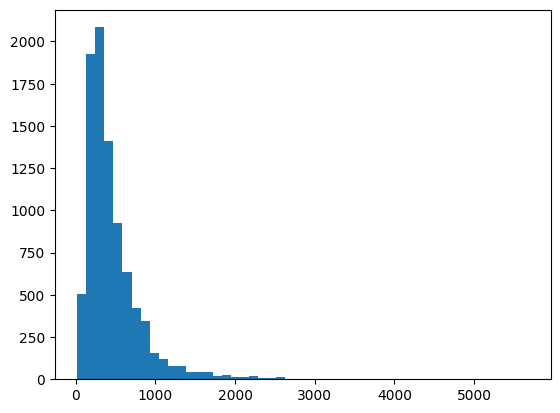

In [41]:
plt.hist(len_anomalies, bins=50)

(array([1.12442e+05, 3.89700e+04, 1.40660e+04, 6.13500e+03, 2.93700e+03,
        1.63800e+03, 1.03000e+03, 7.01000e+02, 3.11000e+02, 2.22000e+02,
        1.31000e+02, 1.24000e+02, 7.20000e+01, 6.40000e+01, 5.70000e+01,
        3.90000e+01, 3.10000e+01, 1.40000e+01, 1.60000e+01, 2.10000e+01,
        1.00000e+01, 1.20000e+01, 1.40000e+01, 6.00000e+00, 3.00000e+00,
        1.00000e+00, 3.00000e+00, 1.00000e+00, 0.00000e+00, 5.00000e+00,
        1.00000e+00, 1.00000e+00, 0.00000e+00, 0.00000e+00, 0.00000e+00,
        0.00000e+00, 0.00000e+00, 0.00000e+00, 0.00000e+00, 0.00000e+00,
        0.00000e+00, 0.00000e+00, 2.00000e+00, 0.00000e+00, 0.00000e+00,
        0.00000e+00, 0.00000e+00, 0.00000e+00, 0.00000e+00, 1.00000e+00]),
 array([   0.  ,  113.64,  227.28,  340.92,  454.56,  568.2 ,  681.84,
         795.48,  909.12, 1022.76, 1136.4 , 1250.04, 1363.68, 1477.32,
        1590.96, 1704.6 , 1818.24, 1931.88, 2045.52, 2159.16, 2272.8 ,
        2386.44, 2500.08, 2613.72, 2727.36, 2841.  , 29

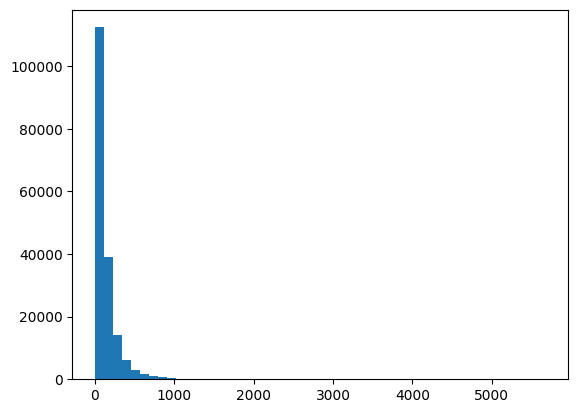

In [42]:
full_len = [len(x) for x in corpus]
plt.hist(full_len, bins=50)

In [ ]:
t['IsoForestPredictions'] = isoForestPredictions

In [4]:
from sentence_transformers import SentenceTransformer

c:\Users\artom\AppData\Local\Programs\Python\Python311\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [5]:
model = SentenceTransformer('paraphrase-multilingual-MiniLM-L12-v2')

In [49]:
import time
start_time = time.time()
res = model.encode(corpus)
end_time = time.time()
res

array([[-0.05493183,  0.1982454 , -0.36483532, ..., -0.4983733 ,
        -0.01813694,  0.1657244 ],
       [ 0.01766378,  0.19743297, -0.19581708, ..., -0.34266216,
         0.04980003,  0.19916469],
       [-0.30604133,  0.20877041, -0.18087766, ...,  0.01646822,
         0.08084846,  0.23291114],
       ...,
       [-0.20032443, -0.01760143,  0.01148581, ..., -0.0666192 ,
         0.04601553,  0.23927614],
       [ 0.02429736,  0.13319375, -0.23714718, ..., -0.01477841,
         0.17867394,  0.10449119],
       [-0.15788023,  0.12226181, -0.31757754, ...,  0.14165884,
        -0.04038703,  0.16046162]], dtype=float32)

In [51]:
type(res)

numpy.ndarray

In [55]:
t = t.with_columns(
    pl.Series("Encoding", res.tolist())  # ✅ Ensure it's a list
)

In [56]:
t.write_parquet("review_embeddings.parquet")

In [57]:
t

review,review_translate,rating,entity_name,dataset_name,title_translate,translated,review_translate_sentences,review_translate_sentences_tokens,review_translate_sentences_pos,review_translate_sentences_lemma,is_question,tokens,tokenized_review,Encoding
str,str,f64,str,str,str,bool,str,str,str,str,str,list[str],str,list[f64]
"""За такі гроші це самий топ ""","""За такі гроші це самий топ""",5.0,"""xiaomi_hsej03jy_black""","""rozetka""",null,false,"""['За такі гроші це самий топ']""","""[['За', 'такі', 'гроші', 'це',…","""[['ADVB', 'NPRO', 'NOUN', 'PRC…","""[['за', 'такий', 'гріш', 'це',…","""[False]""","[""гроші"", ""топ""]","""гроші топ""","[-0.054932, 0.198245, … 0.165724]"
"""За такі гроші - просто супер! …","""За такі гроші - просто супер !…",5.0,"""esperanza_eza108""","""rozetka""",null,false,"""['За такі гроші - просто супер…","""[['За', 'такі', 'гроші', '-', …","""[['ADVB', 'NPRO', 'NOUN', 'PNC…","""[['за', 'такий', 'гріш', '-', …","""[False, False]""","[""гроші"", ""суперти"", ""рекомендувати""]","""гроші суперти рекомендувати""","[0.017664, 0.197433, … 0.199165]"
"""Купляв на стару сістему як осн…","""Купляв на стару сістему як осн…",4.0,"""kingston_sa400s37_240g""","""rozetka""",null,false,"""['Купляв на стару сістему як о…","""[['Купляв', 'на', 'стару', 'сі…","""[['VERB', 'INTJ', 'ADJF', 'NOU…","""[['купляти', 'на', 'старий', '…","""[False, False]""","[""купляти"", ""старий"", … ""ssd""]","""купляти старий сістема основни…","[-0.306041, 0.20877, … 0.232911]"
"""Онучці дуже сподобався коник-є…","""Онучці дуже сподобався коник -…",5.0,"""jiggly_pup_jp002_wb_pi""","""rozetka""",null,false,"""['Онучці дуже сподобався коник…","""[['Онучці', 'дуже', 'сподобавс…","""[['NOUN', 'ADVB', 'VERB', 'NOU…","""[['онучка', 'дуже', 'сподобати…","""[False, False, False]""","[""онучка"", ""сподобатися"", … ""іграшка""]","""онучка сподобатися коник єдино…","[0.044178, 0.053405, … 0.175957]"
"""Все працює супер ""","""Все працює супер""",5.0,"""lapara_laotgmicrousbadaptor""","""rozetka""",null,false,"""['Все працює супер']""","""[['Все', 'працює', 'супер']]""","""[['NPRO', 'VERB', 'NOUN']]""","""[['весь', 'працювати', 'супер'…","""[False]""","[""працювати"", ""супер""]","""працювати супер""","[0.070666, -0.05023, … 0.203324]"
…,…,…,…,…,…,…,…,…,…,…,…,…,…,…
"""Набор достойный , только кейс …","""Набір пристойний , тільки корп…",5.0,"""intertool_et_6072sp""","""rozetka""",null,true,"""['Набір пристойний , тільки ко…","""[['Набір', 'пристойний', ',', …","""[['ADVB', 'ADJF', 'PNCT', 'PRC…","""[['набір', 'пристойний', ',', …","""[False]""","[""набор."", ""достойныя"", … ""обновлённыя""]","""набор. достойныя только кейс т…","[-0.086428, 0.015302, … 0.075447]"
"""Неплохое кофе, но местами очен…","""Непоганий кави , але місцями д…",5.0,"""ferarra_4820198877217""","""rozetka""",null,true,"""['Непоганий кави , але місцями…","""[['Непоганий', 'кави', ',', 'а…","""[['ADJF', 'NOUN', 'PNCT', 'CON…","""[['непоганий', 'кава', ',', 'а…","""[False]""","[""неплохое"", ""кофе"", … ""ароматизированное""]","""неплохое кофе мест очення аром…","[-0.018747, -0.17118, … 0.02068]"
"""Любовь с первого прикосновения…","""Любов з першого дотику . Ох зр…",5.0,"""a4tech_kv300_h_xkey""","""rozetka""",null,true,"""['Любов з першого дотику .', '…","""[['Любов', 'з', 'першого', 'до…","""[['NOUN', 'PREP', 'ADJF', 'NOU…","""[['любов', 'з', 'перший', 'дот…","""[False, False, False, False, F…","[""любовь"", ""с."", … ""ее""]","""любовь с. первий прикосновения…","[-0.200324, -0.017601, … 0.239276]"


Text shouldn't be preprocessed before transformer embeddings

In [6]:
corpus_for_embeddings = t['review'].to_list()
corpus_for_embeddings

['За такі гроші це самий топ ',
 'За такі гроші - просто супер! Рекомендую. ',
 'Купляв на стару сістему як основний під віндовс. Нічого складного з встановленням і загрузкой вінди не було, все шустро і без есцесів, робить швидко,в принципі як і хотіли від системи з SSD) ',
 'Онучці дуже сподобався коник-єдиноріг. Вже тиждень з ним грається. Дуже весела позитивна іграшка ',
 'Все працює супер ',
 "Гарні, м'які ",
 'дві неділі роботи і почав різати швидкість на 2.4 на 5 через стінку на відстань 2 метри не пробиває ',
 'За таку ціну ідеальний вибір. При роботі не перегрівається, електрокабель достатньо довгий. Пробував за допомогою нього знімати стару фарбу з деревяних дверей та одвірок - з задачею справляється. ',
 'Файний смак ',
 'Купував для розворушення старого ноутбуку HP 8440p. Проблем не було. Як що думаєте також брати для даного ноута - беріть. Швидкості добавить та прослуже ще не один рік ',
 'Не встигли навіть нормально затестити. Фільтр протікаєхоч закрутили максимально до кі

In [7]:
import unicodedata
import re
def preprocess_text(text):
    text = text.strip()  # Trim spaces
    text = unicodedata.normalize("NFC", text)  # Normalize Unicode
    text = re.sub(r"\s+", " ", text)  # Remove multiple spaces
    return text

In [8]:
corpus_for_embeddings_prep = [preprocess_text(x) for x in corpus_for_embeddings]
corpus_for_embeddings_prep

['За такі гроші це самий топ',
 'За такі гроші - просто супер! Рекомендую.',
 'Купляв на стару сістему як основний під віндовс. Нічого складного з встановленням і загрузкой вінди не було, все шустро і без есцесів, робить швидко,в принципі як і хотіли від системи з SSD)',
 'Онучці дуже сподобався коник-єдиноріг. Вже тиждень з ним грається. Дуже весела позитивна іграшка',
 'Все працює супер',
 "Гарні, м'які",
 'дві неділі роботи і почав різати швидкість на 2.4 на 5 через стінку на відстань 2 метри не пробиває',
 'За таку ціну ідеальний вибір. При роботі не перегрівається, електрокабель достатньо довгий. Пробував за допомогою нього знімати стару фарбу з деревяних дверей та одвірок - з задачею справляється.',
 'Файний смак',
 'Купував для розворушення старого ноутбуку HP 8440p. Проблем не було. Як що думаєте також брати для даного ноута - беріть. Швидкості добавить та прослуже ще не один рік',
 'Не встигли навіть нормально затестити. Фільтр протікаєхоч закрутили максимально до кінця. повне

In [9]:
import time
start_time = time.time()
res_embeddings = model.encode(corpus_for_embeddings_prep)
end_time = time.time()
res_embeddings

array([[-0.06027849,  0.14519428, -0.26214185, ..., -0.3481317 ,
         0.1818256 ,  0.05807612],
       [-0.17890607, -0.03942506, -0.17493667, ..., -0.29466304,
        -0.00596624,  0.03643651],
       [-0.02330769,  0.24394168, -0.06495045, ...,  0.0475902 ,
        -0.00199327,  0.29667875],
       ...,
       [-0.14738858,  0.01143251,  0.04182243, ...,  0.01696198,
         0.0522801 ,  0.12037008],
       [ 0.08583526,  0.00118707, -0.2384155 , ...,  0.00241075,
         0.1646918 ,  0.04485995],
       [-0.08248401,  0.13991076, -0.13215461, ..., -0.00145886,
        -0.07771881,  0.28399944]], dtype=float32)

In [11]:
t = t.with_columns(
    pl.Series("CorrectEncoding", res_embeddings.tolist())  # ✅ Ensure it's a list
)

In [12]:
t.write_parquet("review_correct_embeddings.parquet")

In [4]:
t = pl.read_parquet("review_correct_embeddings.parquet")

In [5]:
t

review,review_translate,rating,entity_name,dataset_name,title_translate,translated,review_translate_sentences,review_translate_sentences_tokens,review_translate_sentences_pos,review_translate_sentences_lemma,is_question,tokens,tokenized_review,CorrectEncoding
str,str,f64,str,str,str,bool,str,str,str,str,str,list[str],str,list[f64]
"""За такі гроші це самий топ ""","""За такі гроші це самий топ""",5.0,"""xiaomi_hsej03jy_black""","""rozetka""",null,false,"""['За такі гроші це самий топ']""","""[['За', 'такі', 'гроші', 'це',…","""[['ADVB', 'NPRO', 'NOUN', 'PRC…","""[['за', 'такий', 'гріш', 'це',…","""[False]""","[""гроші"", ""топ""]","""гроші топ""","[-0.060278, 0.145194, … 0.058076]"
"""За такі гроші - просто супер! …","""За такі гроші - просто супер !…",5.0,"""esperanza_eza108""","""rozetka""",null,false,"""['За такі гроші - просто супер…","""[['За', 'такі', 'гроші', '-', …","""[['ADVB', 'NPRO', 'NOUN', 'PNC…","""[['за', 'такий', 'гріш', '-', …","""[False, False]""","[""гроші"", ""суперти"", ""рекомендувати""]","""гроші суперти рекомендувати""","[-0.178906, -0.039425, … 0.036437]"
"""Купляв на стару сістему як осн…","""Купляв на стару сістему як осн…",4.0,"""kingston_sa400s37_240g""","""rozetka""",null,false,"""['Купляв на стару сістему як о…","""[['Купляв', 'на', 'стару', 'сі…","""[['VERB', 'INTJ', 'ADJF', 'NOU…","""[['купляти', 'на', 'старий', '…","""[False, False]""","[""купляти"", ""старий"", … ""ssd""]","""купляти старий сістема основни…","[-0.023308, 0.243942, … 0.296679]"
"""Онучці дуже сподобався коник-є…","""Онучці дуже сподобався коник -…",5.0,"""jiggly_pup_jp002_wb_pi""","""rozetka""",null,false,"""['Онучці дуже сподобався коник…","""[['Онучці', 'дуже', 'сподобавс…","""[['NOUN', 'ADVB', 'VERB', 'NOU…","""[['онучка', 'дуже', 'сподобати…","""[False, False, False]""","[""онучка"", ""сподобатися"", … ""іграшка""]","""онучка сподобатися коник єдино…","[0.060857, -0.043451, … 0.229792]"
"""Все працює супер ""","""Все працює супер""",5.0,"""lapara_laotgmicrousbadaptor""","""rozetka""",null,false,"""['Все працює супер']""","""[['Все', 'працює', 'супер']]""","""[['NPRO', 'VERB', 'NOUN']]""","""[['весь', 'працювати', 'супер'…","""[False]""","[""працювати"", ""супер""]","""працювати супер""","[0.011902, -0.214204, … 0.146316]"
…,…,…,…,…,…,…,…,…,…,…,…,…,…,…
"""Набор достойный , только кейс …","""Набір пристойний , тільки корп…",5.0,"""intertool_et_6072sp""","""rozetka""",null,true,"""['Набір пристойний , тільки ко…","""[['Набір', 'пристойний', ',', …","""[['ADVB', 'ADJF', 'PNCT', 'PRC…","""[['набір', 'пристойний', ',', …","""[False]""","[""набор."", ""достойныя"", … ""обновлённыя""]","""набор. достойныя только кейс т…","[-0.006451, 0.087959, … 0.203881]"
"""Неплохое кофе, но местами очен…","""Непоганий кави , але місцями д…",5.0,"""ferarra_4820198877217""","""rozetka""",null,true,"""['Непоганий кави , але місцями…","""[['Непоганий', 'кави', ',', 'а…","""[['ADJF', 'NOUN', 'PNCT', 'CON…","""[['непоганий', 'кава', ',', 'а…","""[False]""","[""неплохое"", ""кофе"", … ""ароматизированное""]","""неплохое кофе мест очення аром…","[-0.158603, -0.267799, … -0.035113]"
"""Любовь с первого прикосновения…","""Любов з першого дотику . Ох зр…",5.0,"""a4tech_kv300_h_xkey""","""rozetka""",null,true,"""['Любов з першого дотику .', '…","""[['Любов', 'з', 'першого', 'до…","""[['NOUN', 'PREP', 'ADJF', 'NOU…","""[['любов', 'з', 'перший', 'дот…","""[False, False, False, False, F…","[""любовь"", ""с."", … ""ее""]","""любовь с. первий прикосновения…","[-0.147389, 0.011433, … 0.12037]"


In [6]:
embeddings = t['CorrectEncoding'].to_list()
embeddings

[[-0.06027849391102791,
  0.14519427716732025,
  -0.2621418535709381,
  -0.0630902349948883,
  -0.049599017947912216,
  -0.22421568632125854,
  0.422231525182724,
  0.18408887088298798,
  0.1751876175403595,
  -0.19918227195739746,
  0.11955225467681885,
  -0.10418467968702316,
  0.004834958352148533,
  -0.059992000460624695,
  -0.18037639558315277,
  -0.07486063241958618,
  0.06677946448326111,
  -0.11377130448818207,
  0.032645080238580704,
  -0.0023944363929331303,
  0.012041974812746048,
  -0.11322707682847977,
  -0.09429322183132172,
  0.00402040733024478,
  0.18197959661483765,
  0.018565194681286812,
  -0.0936313346028328,
  0.06644828617572784,
  0.019057679921388626,
  -0.10695511847734451,
  0.30936557054519653,
  -0.049319591373205185,
  0.041899628937244415,
  0.05752011761069298,
  0.0105678029358387,
  -0.010534415952861309,
  0.08575918525457382,
  0.07096341252326965,
  0.1381109058856964,
  0.07141037285327911,
  0.016753528267145157,
  0.002561991335824132,
  -0.11343

In [18]:
from sklearn.ensemble import IsolationForest
isoForestAuto = IsolationForest(contamination='auto', random_state=42)
isoForestPredictionsAuto = isoForestAuto.fit_predict(embeddings)

In [20]:
import numpy as np
np.sum(isoForestPredictionsAuto == -1)

3316

In [7]:
isoForest = IsolationForest(contamination=0.05, random_state=42)
isoForestPredictions = isoForest.fit_predict(embeddings)

In [9]:
import numpy as np
np.sum(isoForestPredictions == -1)

8954

In [10]:
np.unique(isoForestPredictions)

array([-1,  1])

In [11]:
t = t.with_columns(
    pl.Series("Labels", isoForestPredictions.tolist())  # ✅ Ensure it's a list
)
t

review,review_translate,rating,entity_name,dataset_name,title_translate,translated,review_translate_sentences,review_translate_sentences_tokens,review_translate_sentences_pos,review_translate_sentences_lemma,is_question,tokens,tokenized_review,CorrectEncoding,Labels
str,str,f64,str,str,str,bool,str,str,str,str,str,list[str],str,list[f64],i64
"""За такі гроші це самий топ ""","""За такі гроші це самий топ""",5.0,"""xiaomi_hsej03jy_black""","""rozetka""",null,false,"""['За такі гроші це самий топ']""","""[['За', 'такі', 'гроші', 'це',…","""[['ADVB', 'NPRO', 'NOUN', 'PRC…","""[['за', 'такий', 'гріш', 'це',…","""[False]""","[""гроші"", ""топ""]","""гроші топ""","[-0.060278, 0.145194, … 0.058076]",1
"""За такі гроші - просто супер! …","""За такі гроші - просто супер !…",5.0,"""esperanza_eza108""","""rozetka""",null,false,"""['За такі гроші - просто супер…","""[['За', 'такі', 'гроші', '-', …","""[['ADVB', 'NPRO', 'NOUN', 'PNC…","""[['за', 'такий', 'гріш', '-', …","""[False, False]""","[""гроші"", ""суперти"", ""рекомендувати""]","""гроші суперти рекомендувати""","[-0.178906, -0.039425, … 0.036437]",1
"""Купляв на стару сістему як осн…","""Купляв на стару сістему як осн…",4.0,"""kingston_sa400s37_240g""","""rozetka""",null,false,"""['Купляв на стару сістему як о…","""[['Купляв', 'на', 'стару', 'сі…","""[['VERB', 'INTJ', 'ADJF', 'NOU…","""[['купляти', 'на', 'старий', '…","""[False, False]""","[""купляти"", ""старий"", … ""ssd""]","""купляти старий сістема основни…","[-0.023308, 0.243942, … 0.296679]",1
"""Онучці дуже сподобався коник-є…","""Онучці дуже сподобався коник -…",5.0,"""jiggly_pup_jp002_wb_pi""","""rozetka""",null,false,"""['Онучці дуже сподобався коник…","""[['Онучці', 'дуже', 'сподобавс…","""[['NOUN', 'ADVB', 'VERB', 'NOU…","""[['онучка', 'дуже', 'сподобати…","""[False, False, False]""","[""онучка"", ""сподобатися"", … ""іграшка""]","""онучка сподобатися коник єдино…","[0.060857, -0.043451, … 0.229792]",1
"""Все працює супер ""","""Все працює супер""",5.0,"""lapara_laotgmicrousbadaptor""","""rozetka""",null,false,"""['Все працює супер']""","""[['Все', 'працює', 'супер']]""","""[['NPRO', 'VERB', 'NOUN']]""","""[['весь', 'працювати', 'супер'…","""[False]""","[""працювати"", ""супер""]","""працювати супер""","[0.011902, -0.214204, … 0.146316]",1
…,…,…,…,…,…,…,…,…,…,…,…,…,…,…,…
"""Набор достойный , только кейс …","""Набір пристойний , тільки корп…",5.0,"""intertool_et_6072sp""","""rozetka""",null,true,"""['Набір пристойний , тільки ко…","""[['Набір', 'пристойний', ',', …","""[['ADVB', 'ADJF', 'PNCT', 'PRC…","""[['набір', 'пристойний', ',', …","""[False]""","[""набор."", ""достойныя"", … ""обновлённыя""]","""набор. достойныя только кейс т…","[-0.006451, 0.087959, … 0.203881]",1
"""Неплохое кофе, но местами очен…","""Непоганий кави , але місцями д…",5.0,"""ferarra_4820198877217""","""rozetka""",null,true,"""['Непоганий кави , але місцями…","""[['Непоганий', 'кави', ',', 'а…","""[['ADJF', 'NOUN', 'PNCT', 'CON…","""[['непоганий', 'кава', ',', 'а…","""[False]""","[""неплохое"", ""кофе"", … ""ароматизированное""]","""неплохое кофе мест очення аром…","[-0.158603, -0.267799, … -0.035113]",1
"""Любовь с первого прикосновения…","""Любов з першого дотику . Ох зр…",5.0,"""a4tech_kv300_h_xkey""","""rozetka""",null,true,"""['Любов з першого дотику .', '…","""[['Любов', 'з', 'першого', 'до…","""[['NOUN', 'PREP', 'ADJF', 'NOU…","""[['любов', 'з', 'перший', 'дот…","""[False, False, False, False, F…","[""любовь"", ""с."", … ""ее""]","""любовь с. первий прикосновения…","[-0.147389, 0.011433, … 0.12037]",1


In [12]:
t.write_parquet("rozetka_corpus_with_labels.parquet")

In [23]:
inds = np.where(isoForestPredictions == -1)[0]
inds

array([    30,     46,     51, ..., 178986, 178997, 179046], dtype=int64)

In [30]:
autoInds = np.where(isoForestPredictionsAuto == -1)[0]
autoInds

array([    30,     46,    139, ..., 178965, 178967, 178979], dtype=int64)

In [25]:
corpus = t['review']

In [26]:
corpus = np.array(corpus)
anomalies = corpus[inds]
anomalies

array(['Монитор бомба! ', 'Дуже смачний чай ',
       'Перестав працювати один навушник!!! ', ...,
       'А мышка подходит для PS4???',
       'Хорошая, простая мышка и удобная мышка.',
       'Самый любимый чай, очень нежный и вкусный. А аромат просто божественный!'],
      dtype='<U6716')

In [36]:
anomalies[101:110]

array(['Простенький мод цієї клавіатури для Mac. Кейкапи кольору "динька". ',
       'Нормальні навушники ', 'це мій чай ',
       'Гарний подарунок для себе чи когось. Смачний чай (мій улюблений). Гарне пакування. ',
       'Чай досить приємний на смак, аромат неперевершений ',
       'Дуже смачна кава ', 'разочарован ', 'Хороший кофе ціна супер ',
       'Смачна кава за дуже вигідною ціною. '], dtype='<U6716')

In [31]:
autoAnomalies = corpus[autoInds]
autoAnomalies

array(['Монитор бомба! ', 'Дуже смачний чай ',
       'Кава дуже сподобалася. Гарний смак та аромат. ', ...,
       'Ребенок доволен подарком)', 'Отличный кофе', 'Муж доволен'],
      dtype='<U6716')

In [32]:
autoAnomalies[30:40]

array(['Дитина відмовляється її їсти ',
       'Дякую, за чудові захисні маски! ', 'шоколад дуже смачний ',
       'Чудова паста. ', 'В середньому робота на 50% ', 'Достойна кава! ',
       'Цена ', 'Смачний шоколад ', 'Відпрацював майже 4 роки в UPSі. ',
       'Чудова вага, що синхронізується зі смартфоном. '], dtype='<U6716')

In [37]:
from sklearn.cluster import DBSCAN

In [38]:
dbscan = DBSCAN(eps=0.2, min_samples=7, metric="cosine")  
clusters = dbscan.fit_predict(embeddings)

In [40]:
outliersDBSCAN = np.where(clusters == -1 )[0]
outliersDBSCAN

array([     2,      3,      6, ..., 179073, 179076, 179078], dtype=int64)

In [41]:
outliersDBSCAN.shape

(75653,)